<a href="https://colab.research.google.com/github/tainangao/Cybersecurity/blob/master/Copy_of_WEEK_3_FRAUD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# IEEE-CIS Fraud Detection


## Imports

In [1]:
! pip install -q kaggle
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"tainangao","key":"652178c9154b6ae494fd27a5dc17f549"}'}

In [2]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle competitions download -c 'ieee-fraud-detection'

  0% 0.00/3.21M [00:00<?, ?B/s]
100% 3.21M/3.21M [00:00<00:00, 108MB/s]
  0% 0.00/3.26M [00:00<?, ?B/s]
100% 3.26M/3.26M [00:00<00:00, 108MB/s]
 63% 33.0M/52.2M [00:00<00:00, 70.5MB/s]
100% 52.2M/52.2M [00:00<00:00, 132MB/s] 
 63% 37.0M/58.3M [00:00<00:00, 165MB/s]
100% 58.3M/58.3M [00:00<00:00, 195MB/s]
  0% 0.00/1.14M [00:00<?, ?B/s]
100% 1.14M/1.14M [00:00<00:00, 162MB/s]


In [3]:
!unzip test_identity.csv.zip
!unzip test_transaction.csv.zip
!unzip train_identity.csv.zip
!unzip train_transaction.csv.zip
!unzip sample_submission.csv.zip

Archive:  test_identity.csv.zip
  inflating: test_identity.csv       
Archive:  test_transaction.csv.zip
  inflating: test_transaction.csv    
Archive:  train_identity.csv.zip
  inflating: train_identity.csv      
Archive:  train_transaction.csv.zip
  inflating: train_transaction.csv   
Archive:  sample_submission.csv.zip
  inflating: sample_submission.csv   


In [0]:
# From kernel https://www.kaggle.com/gemartin/load-data-reduce-memory-usage

def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2    
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

Import libraries 

In [0]:
import warnings
warnings.simplefilter('ignore')


import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)


import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
mpl.style.use(['seaborn-pastel']) 


# Preprocessing, modelling and evaluating
from sklearn import preprocessing
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold, cross_val_score, KFold, train_test_split


import os
import gc
# print(os.listdir("../input"))



Load datasets and reduce memory usage

In [6]:
%%time
warnings.simplefilter('ignore')
files = ['test_identity.csv', 
         'test_transaction.csv',
         'train_identity.csv',
         'train_transaction.csv',
         'sample_submission.csv']

def load_data(file):
    return reduce_mem_usage(pd.read_csv(file))
    
import multiprocessing
with multiprocessing.Pool() as pool:
    test_id, test_trn, train_id, train_trn, sample_submission = pool.map(load_data, files)

Mem. usage decreased to 25.44 Mb (42.7% reduction)
Mem. usage decreased to 25.86 Mb (42.7% reduction)
Mem. usage decreased to  2.90 Mb (62.5% reduction)
Mem. usage decreased to 472.59 Mb (68.9% reduction)
Mem. usage decreased to 542.35 Mb (69.4% reduction)
CPU times: user 1.91 s, sys: 1.4 s, total: 3.32 s
Wall time: 2min 5s


Check the shapes of the datasets

In [7]:
print('train_trn shape is {}'.format(train_trn.shape))
print('test_trn shape is {}'.format(test_trn.shape))
print('train_id shape is {}'.format(train_id.shape))
print('test_id shape is {}'.format(test_id.shape))

train_trn shape is (590540, 394)
test_trn shape is (506691, 393)
train_id shape is (144233, 41)
test_id shape is (141907, 41)


Let's take a glance of the training sets

In [8]:
train_trn.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,...,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,50.0,1758.0,925.0,0.0,354.0,0.0,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [9]:
train_id.head()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,52.0,NaN,Found,Found,121.0,NaN,410.0,142.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,100.0,NotFound,52.0,NaN,New,NotFound,225.0,NaN,176.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,NaN,-300.0,Found,Found,166.0,15.0,529.0,575.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,Mac OS X 10_11_6,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


# EDA 





First, let's examine the target distribution in the training set. 

It seems the data is extremely unbalanced, and we have to be mindful of it when chosing evaluation matrix.

0    0.96501
1    0.03499
Name: isFraud, dtype: float64


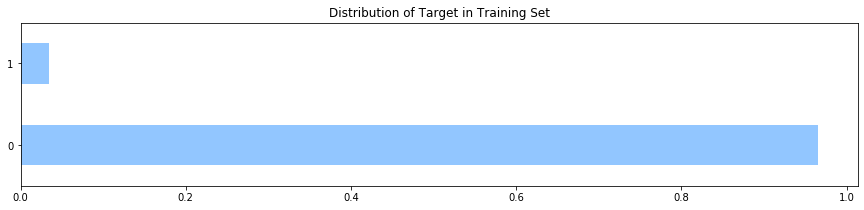

In [10]:
target = train_trn['isFraud'].value_counts(normalize=True)
print (target)

target.plot(kind='barh', figsize=(15,3), title='Distribution of Target in Training Set')
plt.show()

### Quantiles of Fraud and Non Fraud Transactions

The amount of fraudulent transactions is not necessarily higher than that of normal ones.

In [11]:
a = train_trn[train_trn['isFraud']==1]['TransactionAmt'].quantile([.01, .1, .25, .5, .75, .9, .99])
b = train_trn[train_trn['isFraud']==0]['TransactionAmt'].quantile([.01, .1, .25, .5, .75, .9, .99])

pd.concat([a,b], axis=1, keys=['Fraud', "Non Fraud"])

,Fraud,Non Fraud
0.01,6.739453,9.511875
0.10,18.937500,26.312500
0.25,35.031250,43.968750
0.50,75.000000,68.500000
0.75,161.000000,120.000000
0.90,335.000000,267.100000
0.99,994.000000,1104.000000


## TransactionDT


Since `TransactionDT` is integer, we need to convert it into datetime objects.

In [12]:
train_trn['TransactionDT'].sample(5)

470845    12157925
169348     3630762
68009      1540749
33044       833028
319371     7940542
Name: TransactionDT, dtype: int32

In [0]:
import datetime as dt

START_DATE = '2017-11-30'
startdate = dt.datetime.strptime(START_DATE, "%Y-%m-%d")
train_trn['date'] = train_trn['TransactionDT'].apply(lambda x: (startdate + dt.timedelta(seconds=x)))

train_trn['weekdays']=train_trn['date'].dt.dayofweek
train_trn['hours']=train_trn['date'].dt.hour
train_trn['days']=train_trn['date'].dt.day
train_trn['year_month'] = train_trn['date'].dt.year.astype(str) + '-' + train_trn['date'].dt.month.astype(str)

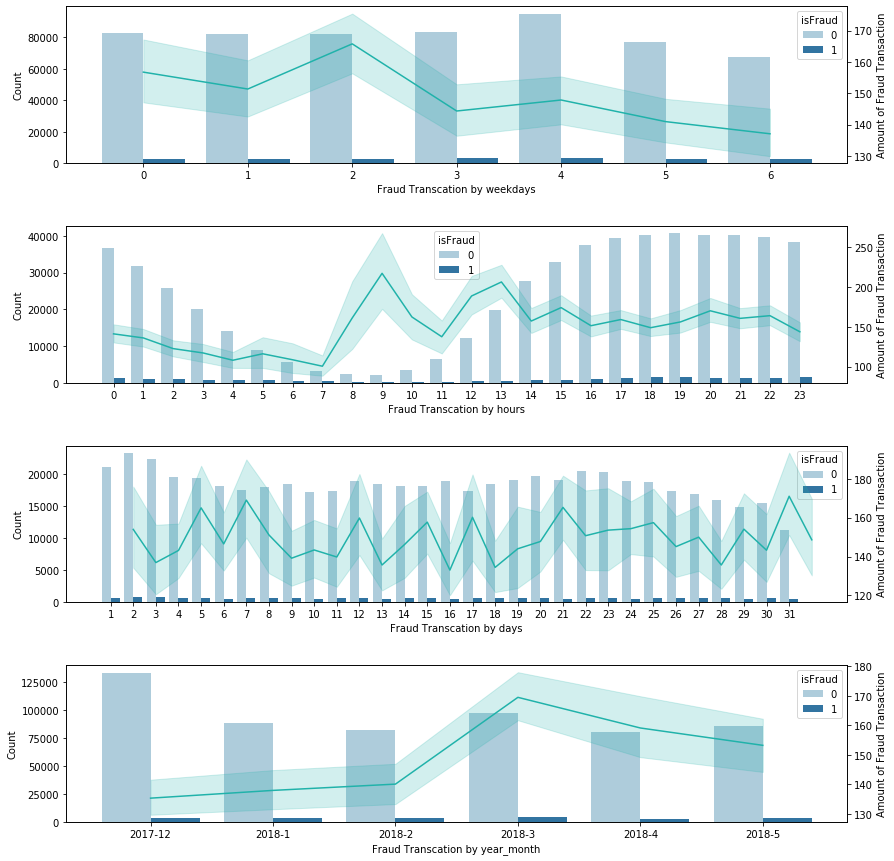

In [14]:
time_cols=['weekdays','hours','days','year_month']
fig = plt.figure(figsize=(14,15))

for sp in range(0,4):
    ax = fig.add_subplot(4,1,sp+1)
    ax = sns.countplot(x=time_cols[sp], hue="isFraud", data=train_trn, ax=ax, palette="Paired")
    ax.set_ylabel('Count')
    axx= ax.twinx()
    axx= sns.lineplot(x=time_cols[sp], y="TransactionAmt", data=train_trn[train_trn['isFraud']==1], color='lightseagreen')
    axx.set_ylabel('Amount of Fraud Transaction')
    ax.set_xlabel('Fraud Transcation by {}'.format(time_cols[sp]))

plt.subplots_adjust(hspace = 0.4)    
plt.show()

## TransactionAmt

In [15]:
import plotly.graph_objects as go
fig = go.Figure(data=go.Bar(y=[2, 3, 1]))
fig.write_html('first_figure.html', auto_open=True)
from plotly.subplots import make_subplots

# Limit the data to fraudulent data only
condition = train_trn['isFraud']==1

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=train_trn[condition]['date'], y=train_trn[condition]['TransactionAmt'], name="Fraud Transaction Amount"),
    secondary_y=False,
)

fig.add_trace(
    go.Histogram(x=train_trn[condition]['date'], name='# of Fraud Transaction'),
    secondary_y=True
)

# Add figure title
fig.update_layout(title_text="<b>Fraud Transaction Amount and Count by Date</b>")
# Set y-axes titles
fig.update_yaxes(title_text="<b>Fraud Transaction Amount</b>", secondary_y=False)
fig.update_yaxes(title_text="<b># of Fraud Transaction</b>", secondary_y=True)

fig.update_traces(opacity=0.5)


fig.show()

## ProductCD

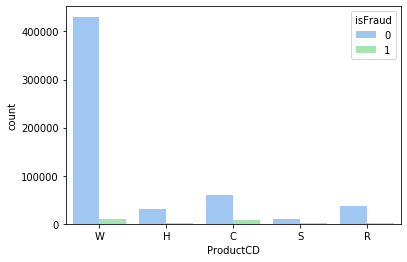

In [16]:
ax = sns.countplot(x="ProductCD", hue="isFraud", data=train_trn)

In [17]:
fig = go.Figure()

fig.add_trace(go.Violin(x=train_trn['ProductCD'][train_trn['isFraud']==0 ],
                        y=train_trn['TransactionAmt'][train_trn['isFraud']==0][train_trn['TransactionAmt']<=500],
                        legendgroup='Non Fraud', scalegroup='Non Fraud', name='Non Fraud',
                        side='negative',
                        line_color='blue')
             )
fig.add_trace(go.Violin(x=train_trn['ProductCD'][train_trn['isFraud']==1 ],
                        y=train_trn['TransactionAmt'][train_trn['isFraud']==1][train_trn['TransactionAmt']<=500],
                        legendgroup='Fraud', scalegroup='Fraud', name='Fraud',
                        side='positive',
                        line_color='orange')
             )
fig.update_traces(meanline_visible=True)
fig.update_layout(violingap=0, violinmode='overlay')
fig.show()

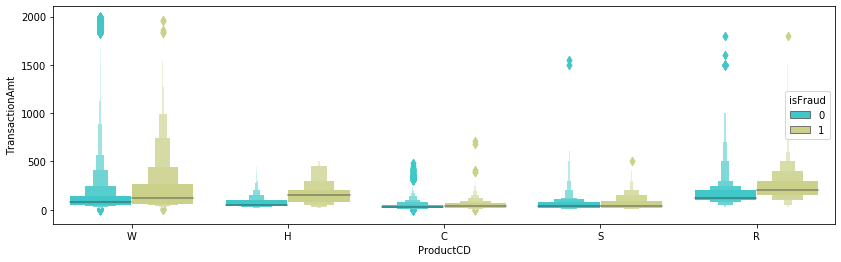

In [18]:
plt.figure(figsize=(14,4))
sns.boxenplot(x="ProductCD", y="TransactionAmt", data=train_trn[train_trn['TransactionAmt'] <= 2000],hue='isFraud',palette='rainbow')
plt.show()

## card 1 - card 6

card1 - card6 are payment card information, such as card type, card category, issue bank, country, etc.. Based on the output below, we can tell that card 4 is the issue bank and card 6 is the card type. 

Since there are quite a few variable names that are alphanumeric, let's create a function to make generating variable names easier.

In [0]:
def create_col_names(base_str, start_int, end_int):
  return [base_str + str(i) for i in range(start_int, end_int+1)]

In [20]:
card_cols = create_col_names('card',1,6)

print('# of null values \n')
print(train_trn[card_cols].isnull().sum())

print('\n\n# of unique values \n')
print(train_trn[card_cols].nunique())

print('\n\n card1 - card6\n')
print(train_trn[card_cols].head(10))

print('\n\n card4\n')
print(train_trn['card4'].value_counts())

print('\n\n card6\n')
print(train_trn['card6'].value_counts())

# of null values 

card1       0
card2    8933
card3    1565
card4    1577
card5    4259
card6    1571
dtype: int64


# of unique values 

card1    13553
card2      500
card3      114
card4        4
card5      119
card6        4
dtype: int64


 card1 - card6

   card1  card2  card3       card4  card5   card6
0  13926    NaN  150.0    discover  142.0  credit
1   2755  404.0  150.0  mastercard  102.0  credit
2   4663  490.0  150.0        visa  166.0   debit
3  18132  567.0  150.0  mastercard  117.0   debit
4   4497  514.0  150.0  mastercard  102.0  credit
5   5937  555.0  150.0        visa  226.0   debit
6  12308  360.0  150.0        visa  166.0   debit
7  12695  490.0  150.0        visa  226.0   debit
8   2803  100.0  150.0        visa  226.0   debit
9  17399  111.0  150.0  mastercard  224.0   debit


 card4

visa                384767
mastercard          189217
american express      8328
discover              6651
Name: card4, dtype: int64


 card6

debit              439938
credit    

Check out the distribution of card1 and card2.

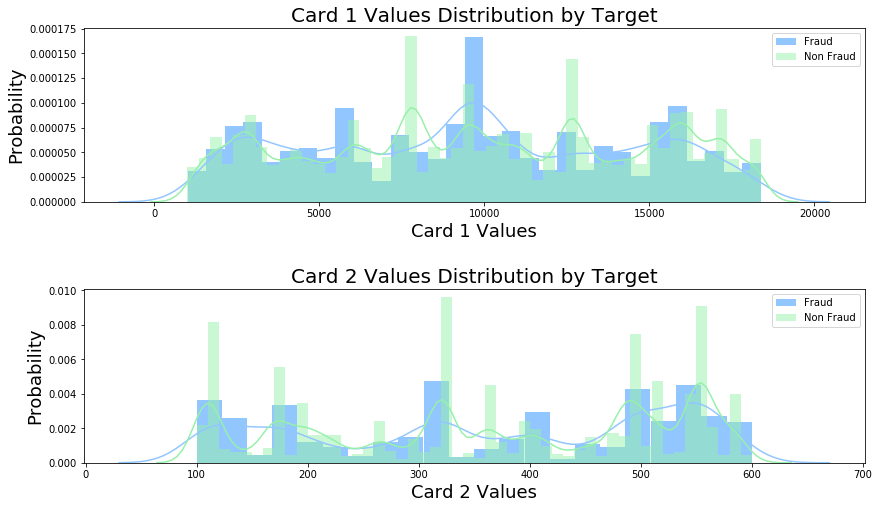

In [21]:
fig = plt.figure(figsize=(14,8))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)

# card1
ax1 = sns.distplot(train_trn[train_trn['isFraud'] == 1]['card1'], label='Fraud', hist_kws=dict(alpha=1),ax=ax1)
ax1 = sns.distplot(train_trn[train_trn['isFraud'] == 0]['card1'], label='Non Fraud', hist_kws=dict(alpha=0.5),ax=ax1)
ax1.legend()
ax1.set_title("Card 1 Values Distribution by Target", fontsize=20)
ax1.set_xlabel("Card 1 Values", fontsize=18)
ax1.set_ylabel("Probability", fontsize=18)

# card2
ax2 = sns.distplot(train_trn[train_trn['isFraud'] == 1]['card2'].dropna(), label='Fraud', hist_kws=dict(alpha=1),ax=ax2)
ax2 = sns.distplot(train_trn[train_trn['isFraud'] == 0]['card2'].dropna(), label='Non Fraud', hist_kws=dict(alpha=0.5),ax=ax2)
ax2.legend()
ax2.set_title("Card 2 Values Distribution by Target", fontsize=20)
ax2.set_xlabel("Card 2 Values", fontsize=18)
ax2.set_ylabel("Probability", fontsize=18)

plt.subplots_adjust(hspace = 0.5)
plt.show()

**card4**

- the majority of card issue back is Visa, and it also has more fraudulent transactions
- when the transaction amount is lower than 2000, Discover has the largest transactiom amount. Consequently, the fraudulent transactiom amount is also larger.

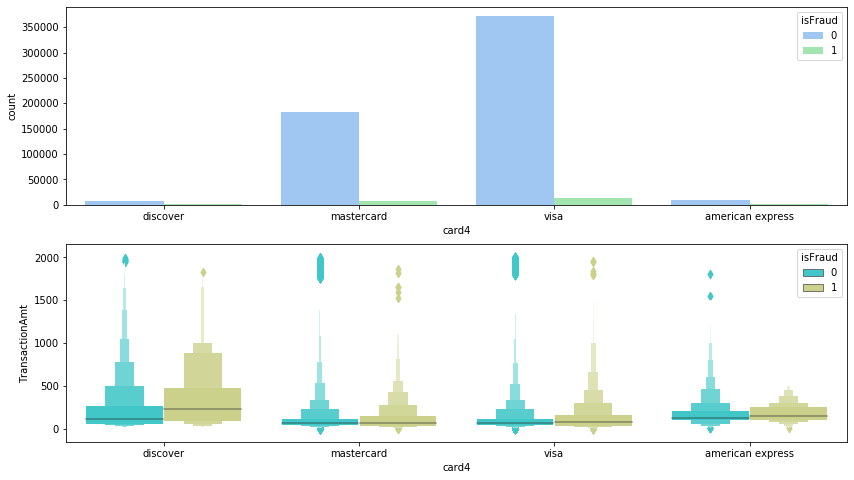

In [22]:
fig = plt.figure(figsize=(14,8))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)

sns.countplot(x="card4", hue="isFraud", data=train_trn, ax=ax1)
sns.boxenplot(x="card4", y="TransactionAmt", data=train_trn[train_trn['TransactionAmt'] <= 2000],hue='isFraud',palette='rainbow', ax=ax2)

plt.show()


**card6**

Although most cards are debit card, the transaction amount of credit card is larger.

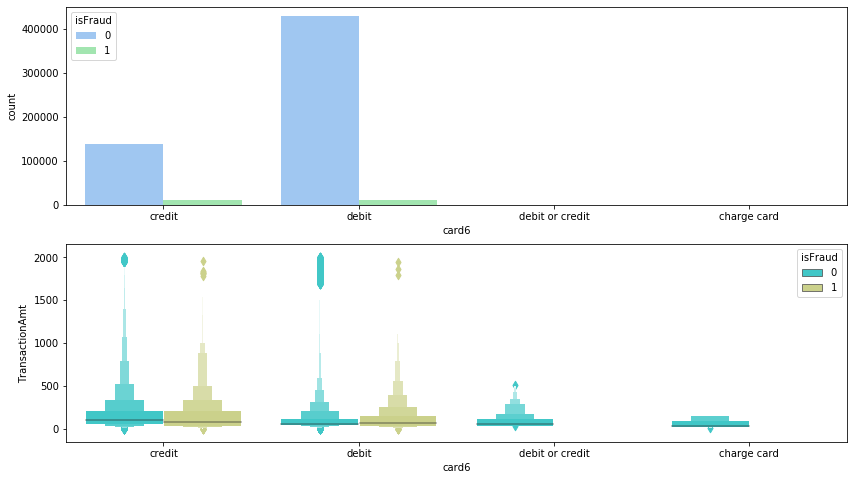

In [23]:
fig = plt.figure(figsize=(14,8))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)

ax1 = sns.countplot(x="card6", hue="isFraud", data=train_trn, ax=ax1)
ax2 = sns.boxenplot(x="card6", y="TransactionAmt", data=train_trn[train_trn['TransactionAmt'] <= 2000],hue='isFraud',palette='rainbow', ax=ax2)

plt.show()

## addr1, addr2

In [24]:
train_trn[['addr1','addr2']].sample(5)

,addr1,addr2
41171,NaN,NaN
586199,387.0,87.0
475541,NaN,NaN
355187,264.0,87.0
551723,299.0,87.0


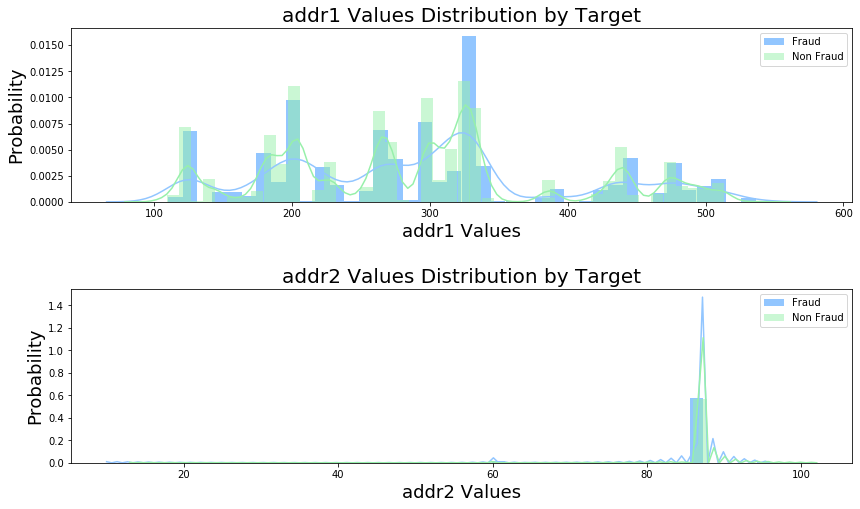

In [25]:
fig = plt.figure(figsize=(14,8))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)

ax1 = sns.distplot(train_trn[train_trn['isFraud'] == 1]['addr1'].dropna(), label='Fraud', hist_kws=dict(alpha=1),ax=ax1)
ax1 = sns.distplot(train_trn[train_trn['isFraud'] == 0]['addr1'].dropna(), label='Non Fraud', hist_kws=dict(alpha=0.5),ax=ax1)
ax1.legend()
ax1.set_title("addr1 Values Distribution by Target", fontsize=20)
ax1.set_xlabel("addr1 Values", fontsize=18)
ax1.set_ylabel("Probability", fontsize=18)

ax2 = sns.distplot(train_trn[train_trn['isFraud'] == 1]['addr2'].dropna(), label='Fraud', hist_kws=dict(alpha=1),ax=ax2)
ax2 = sns.distplot(train_trn[train_trn['isFraud'] == 0]['addr2'].dropna(), label='Non Fraud', hist_kws=dict(alpha=0.5),ax=ax2)
ax2.legend()
ax2.set_title("addr2 Values Distribution by Target", fontsize=20)
ax2.set_xlabel("addr2 Values", fontsize=18)
ax2.set_ylabel("Probability", fontsize=18)

plt.subplots_adjust(hspace = 0.5)
plt.show()

## C1 - C14

These 14 variables all have 590540 values. Before 75 percentile, they all seem to have small values, but the maximum values of them jump to at least 200. Let's examine further.

In [26]:
c_cols = create_col_names('C',1,14)

train_trn[c_cols].describe()

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
count,590540.0,590540.0,590540.000000,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0
mean,NaN,NaN,0.005650,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,0.150635,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
min,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,1.0,1.0,0.000000,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0
50%,1.0,1.0,0.000000,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,3.0,1.0
75%,3.0,3.0,0.000000,0.0,1.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0,12.0,2.0
max,4684.0,5692.0,26.000000,2252.0,349.0,2252.0,2256.0,3332.0,210.0,3256.0,3188.0,3188.0,2918.0,1429.0


In [27]:
train_trn[c_cols].quantile([.8, .9, .95, .96, .97, .98, .99, .995])

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
0.800,3.0,4.0,0.0,1.0,1.0,2.0,0.0,1.0,2.0,1.0,2.0,0.0,17.0,3.0
0.900,7.0,7.0,0.0,1.0,3.0,5.0,1.0,1.0,4.0,1.0,4.0,1.0,37.0,5.0
0.950,22.0,27.0,0.0,1.0,9.0,15.0,1.0,2.0,9.0,2.0,14.0,1.0,102.0,14.0
0.960,79.0,77.0,0.0,2.0,24.0,55.0,1.0,2.0,19.0,2.0,55.0,2.0,277.0,53.0
0.970,110.0,101.0,0.0,2.0,94.0,79.0,1.0,3.0,63.0,3.0,77.0,2.0,439.0,88.0
0.980,132.0,122.0,0.0,3.0,118.0,94.0,2.0,6.0,78.0,5.0,94.0,3.0,493.0,106.0
0.990,164.0,154.0,0.0,6.0,149.0,118.0,4.0,11.0,95.0,15.0,122.0,5.0,578.0,128.0
0.995,234.0,250.0,0.0,35.0,175.0,157.0,14.0,61.0,111.0,65.0,166.0,22.0,684.0,164.0


There seem to be a lot going on in the top 1%.

Let's see C1-C14's relationships with the target:
- C1-C14 are much more corelated with each other than with the target, afterall, they are the same set of variables
- C3,C5,C9 don't have a comparatively strong corelation with other C variables
- C1-C14's relationshiop with the target is weak, as fraudulent transactions are rare

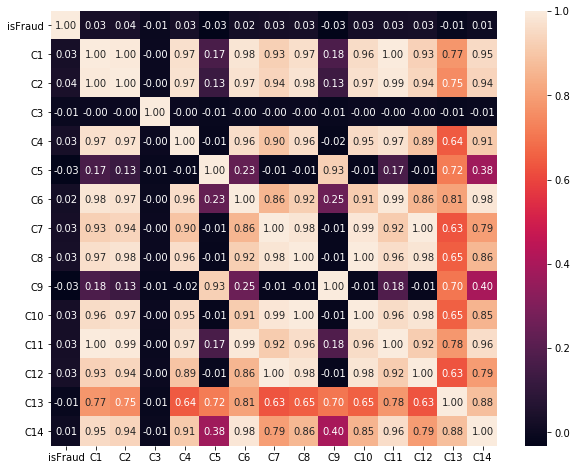

In [28]:
plt.figure(figsize=(10,8))

corr = train_trn[['isFraud'] + c_cols].corr()
sns.heatmap(corr, annot=True, fmt='.2f')

## D1-D15

- D4,D6,D11,D12,D14,D15 have negative values
- the means and standard deviations of D7,D12,D13,D14 are infinity 
- D9 appears to be values between 0.0 and 1.0
- there seem to be a lot going on in the top 1%

In [29]:
d_cols = create_col_names('D',1,15)
train_trn[d_cols].describe()

,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
count,589271.0,309743.0,327662.0,421618.0,280699.0,73187.0,38917.0,74926.000000,74926.000000,514518.0,311253.0,64717.0,61952.0,62187.0,501427.0
mean,NaN,NaN,NaN,NaN,NaN,NaN,inf,NaN,0.560059,NaN,NaN,inf,inf,inf,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,inf,NaN,0.316650,NaN,NaN,inf,inf,inf,NaN
min,0.0,0.0,0.0,-122.0,0.0,-83.0,0.0,0.000000,0.000000,0.0,-53.0,-83.0,0.0,-193.0,-83.0
25%,0.0,26.0,1.0,0.0,1.0,0.0,0.0,0.958496,0.208374,0.0,0.0,0.0,0.0,0.0,0.0
50%,3.0,97.0,8.0,26.0,10.0,0.0,0.0,37.875000,0.666504,15.0,43.0,0.0,0.0,0.0,52.0
75%,122.0,276.0,27.0,253.0,32.0,40.0,17.0,188.000000,0.833496,197.0,274.0,13.0,0.0,2.0,314.0
max,640.0,640.0,819.0,869.0,819.0,873.0,843.0,1708.000000,0.958496,876.0,670.0,648.0,847.0,878.0,879.0


In [30]:
train_trn[d_cols].quantile([.8, .9, .95, .96, .97, .98, .99, .995])

,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
0.800,179.0,336.0,31.0,333.0,45.0,105.0,34.0,241.625,0.833496,273.0,336.0,45.0,1.00,32.00,383.0
0.900,364.0,476.0,65.0,482.0,117.0,309.0,154.0,442.750,0.916504,461.0,462.0,258.0,27.00,262.00,509.0
0.950,489.0,540.0,129.0,544.0,246.0,405.0,321.0,738.500,0.958496,535.0,532.0,381.0,109.00,396.00,566.0
0.960,512.0,556.0,157.0,559.0,287.0,430.0,356.0,800.000,0.958496,552.0,548.0,408.0,149.00,420.00,579.0
0.970,536.0,575.0,198.0,577.0,337.0,461.0,365.0,861.500,0.958496,573.0,566.0,437.0,213.00,454.00,596.0
0.980,566.0,595.0,259.0,598.0,379.0,500.0,378.0,892.000,0.958496,595.0,585.0,472.0,300.00,492.25,613.0
0.990,602.0,617.0,356.0,623.0,455.0,593.0,429.0,984.000,0.958496,622.0,609.0,514.0,371.50,562.00,635.0
0.995,621.0,630.0,418.0,639.0,509.0,698.0,481.5,1142.000,0.958496,639.0,627.0,546.5,434.25,676.00,647.0


- compared to the relationships between C1-C14, that between D1-D15 are weaker
- the relationships of D8,D9,D14 with other D variables are comparatively weaker
- D1-D15's overall relationship with the target is somewhat higher than C1-C14's

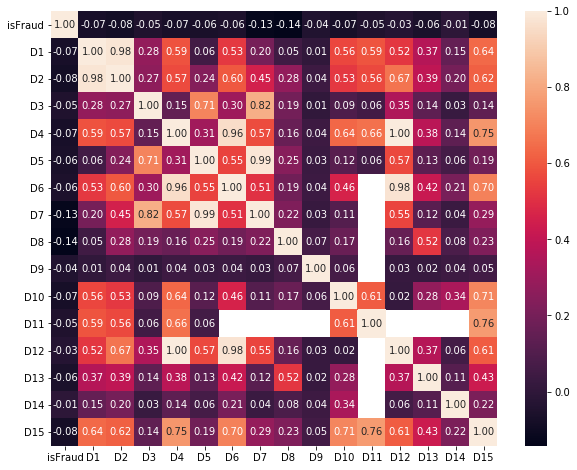

In [31]:
plt.figure(figsize=(10,8))

corr = train_trn[['isFraud'] + d_cols].corr()
sns.heatmap(corr, annot=True, fmt='.2f')

## M1 - M9

M1-M3 and M5-M9 all seem to be boolean, while M4 appears to be a catrgorical variable with 3 classes.


In [32]:
m_cols = create_col_names('M',1,9)

train_trn[m_cols].describe()

,M1,M2,M3,M4,M5,M6,M7,M8,M9
count,319440,319440,319440,309096,240058,421180,244275,244288,244288
unique,2,2,2,3,2,2,2,2,2
top,T,T,T,M0,F,F,F,F,T
freq,319415,285468,251731,196405,132491,227856,211374,155251,205656


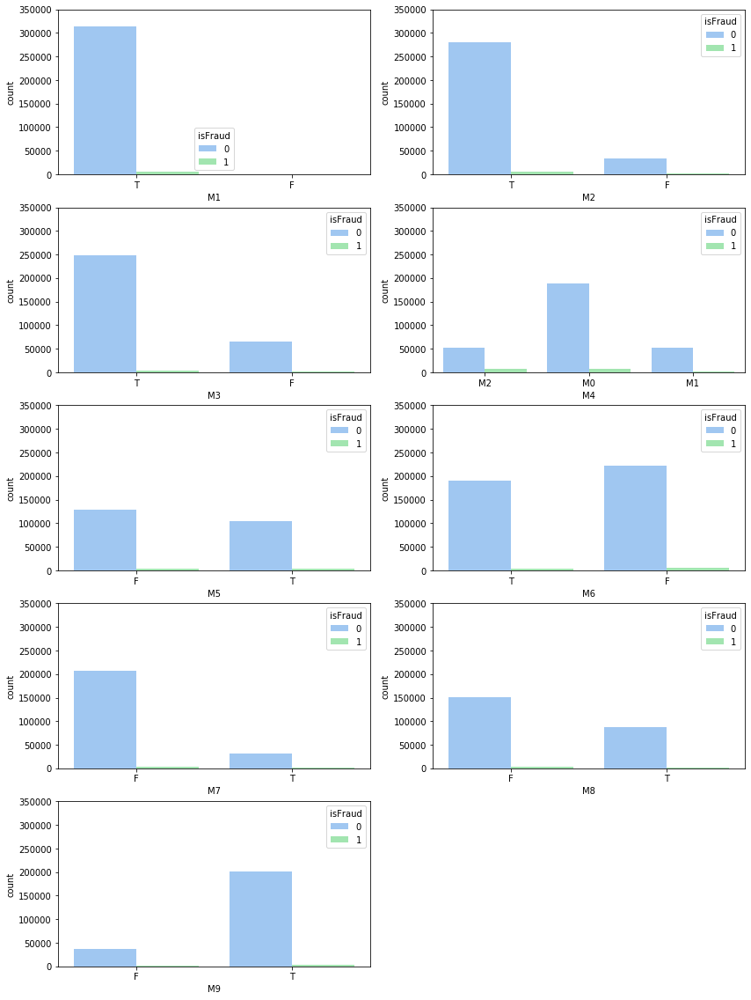

In [43]:
fig = plt.figure(figsize=(14,20))

for sp in range(0,9):
    ax = fig.add_subplot(5,2,sp+1)
    ax = sns.countplot(x=m_cols[sp], hue='isFraud', data=train_trn, ax=ax)
    ax.set(ylim=(0,350000))
    
plt.show()

## DeviceType

desktop    85165
mobile     55645
Name: DeviceType, dtype: int64


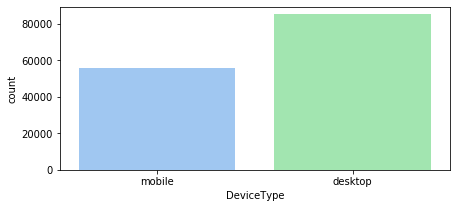

In [0]:
print(train_id['DeviceType'].value_counts())

fig = plt.figure(figsize=(7,3))
sns.countplot(x='DeviceType',data=train_id)
plt.show()

# Machine Learning

## PCA

In [0]:
# drop columns for merging data frames for machine learning
train_trn.drop(['date','days','weekdays','hours','year_month'],axis=1,inplace=True)
train_id.drop(['DeviceInfo'],axis=1, inplace=True)
test_id.drop(['DeviceInfo'],axis=1, inplace=True)

In [0]:
v_cols = create_col_names('V', 1, 339)

In [0]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer

In [0]:
# impute median for v_cols
imp_median = SimpleImputer(missing_values=np.nan, strategy='median')

# train_trn
train_imp_median = imp_median.fit(train_trn[v_cols])
train_trn[v_cols] = train_imp_median.transform(train_trn[v_cols])

# test_trn
test_imp_median = imp_median.fit(test_trn[v_cols])
test_trn[v_cols] = test_imp_median.transform(test_trn[v_cols])

In [0]:
# scale v_cols
scaler = MinMaxScaler(feature_range=[0, 1])

# train_trn
train_trn[v_cols] = scaler.fit_transform(train_trn[v_cols])

# test_trn
test_trn[v_cols] = scaler.fit_transform(test_trn[v_cols])

In [0]:
# fit the PCA algorithm with the data
pca = PCA().fit(train_trn[v_cols])
pca = PCA().fit(test_trn[v_cols])

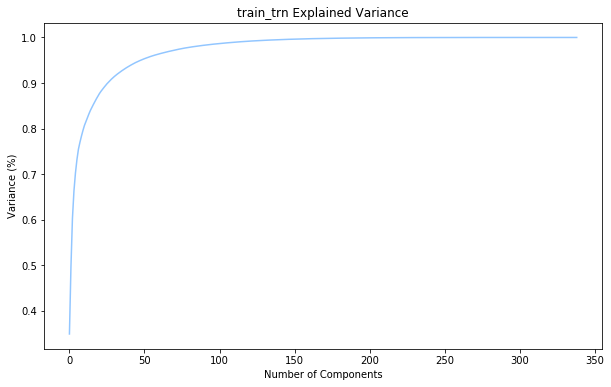

In [0]:
# plot the Cumulative Summation of the Explained Variance
plt.figure(figsize=(10,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('train_trn Explained Variance')
plt.show()

This plot tells us that selecting 50 components we can preserve something around 95% or 97% of the total variance of the data. It makes sense, we’ll not use 100% of our variance, because it denotes all components, and we want only the principal ones.

In [0]:
# fit transform the data
pca = PCA(n_components=50)
train_pca_v = pca.fit_transform(train_trn[v_cols])
test_pca_v = pca.fit_transform(test_trn[v_cols])

In [0]:
print(train_trn[v_cols].shape)
print(train_pca_v.shape)

print(test_trn[v_cols].shape)
print(test_pca_v.shape)

(590540, 339)
(590540, 50)
(506691, 339)
(506691, 50)


In [0]:
# rename columns

# create new column names for PCA columns
PCA_V_names = create_col_names('PCA_V',1,50)

# train_trn
train_pca_v = pd.DataFrame(train_pca_v)
train_pca_v.columns=PCA_V_names

# test_trn
test_pca_v = pd.DataFrame(test_pca_v)
test_pca_v.columns=PCA_V_names

In [0]:
# replace old v_cols with new PCA columns

# train_trn
train_trn.drop(v_cols, axis=1, inplace=True)
train_trn = pd.concat([train_trn, train_pca_v],axis=1)

# test_trn
test_trn.drop(v_cols, axis=1, inplace=True)
test_trn = pd.concat([test_trn, test_pca_v],axis=1)

In [0]:
print(train_trn.shape)
print(test_trn.shape)

(590540, 105)
(506691, 104)


## XGBoost

In [0]:
%%time

# merge transaction dataframe with identity dataframe
train = train_trn.merge(train_id, how='left', left_index=True, right_index=True)
X_test = test_trn.merge(test_id, how='left', left_index=True, right_index=True)

print('The shape of training data is {}.'.format(train.shape))
print('The shape of testing data is {}.'.format(X_test.shape))

y_train = train['isFraud'].copy()
X_train = train.drop('isFraud', axis=1)

# Label Encoding
for f in X_train.columns:
    if X_train[f].dtype=='object' or X_test[f].dtype=='object': 
        lbl = preprocessing.LabelEncoder()
        lbl.fit(list(X_train[f].values) + list(X_test[f].values))
        X_train[f] = lbl.transform(list(X_train[f].values))
        X_test[f] = lbl.transform(list(X_test[f].values))



The shape of training data is (590540, 145).
The shape of testing data is (506691, 144).
CPU times: user 49.9 s, sys: 116 ms, total: 50 s
Wall time: 50 s


In [0]:
del train, train_trn, train_id, test_trn, test_id

ROC AUC 0.9571022929892252
ROC AUC 0.950354006135812
ROC AUC 0.9514343157033451
CPU times: user 41.3 s, sys: 14.7 s, total: 56 s
Wall time: 55.9 s


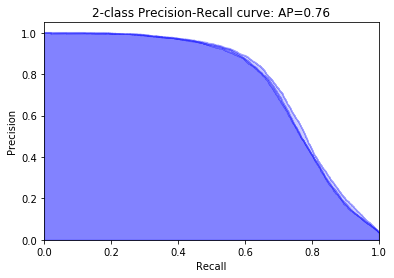

In [0]:
%%time
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score, precision_recall_curve
EPOCHS = 3
kf = KFold(n_splits = EPOCHS, shuffle = True, random_state = 7)
y_preds = np.zeros(sample_submission.shape[0])
y_oof = np.zeros(X_train.shape[0])
for tr_idx, val_idx in kf.split(X_train, y_train):
    clf = xgb.XGBClassifier(
        n_estimators=300,
        max_depth=9,
        learning_rate=0.05,
        subsample=0.9,
        colsample_bytree=0.9,
        tree_method='gpu_hist'
    )
    
    X_tr, X_vl = X_train.iloc[tr_idx, :], X_train.iloc[val_idx, :]
    y_tr, y_vl = y_train.iloc[tr_idx], y_train.iloc[val_idx]
    clf.fit(X_tr, y_tr)
    y_pred_train = clf.predict_proba(X_vl)[:,1]
    y_oof[val_idx] = y_pred_train
    print('ROC AUC {}'.format(roc_auc_score(y_vl, y_pred_train)))

    from inspect import signature
    from sklearn.metrics import average_precision_score
    average_precision = average_precision_score(y_vl, y_pred_train)

    precision, recall, _ = precision_recall_curve(y_vl, y_pred_train)

    # In matplotlib < 1.5, plt.fill_between does not have a 'step' argument
    step_kwargs = ({'step': 'post'}
                  if 'step' in signature(plt.fill_between).parameters
                  else {})
    plt.step(recall, precision, color='b', alpha=0.2,
            where='post')
    plt.fill_between(recall, precision, alpha=0.2, color='b', **step_kwargs)

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.title('2-class Precision-Recall curve: AP={0:0.2f}'.format(
              average_precision))
    
    y_preds+= clf.predict_proba(X_test)[:,1] / EPOCHS

In [0]:
sample_submission['isFraud'] = y_preds
sample_submission.to_csv('simple_xgboost.csv')